In [1]:
import pandas as pd
import numpy as np
import time
from matplotlib import pyplot as plt
import datetime as dt
import talib
from tqdm import tqdm
import colorama as col
from bt import *
from sklearn.preprocessing import MinMaxScaler

Importing Librairies...


In [2]:
%%time
##### Chargement de la base
base = pd.read_csv('Base_Clean/EURUSDm5.csv')

##### On fixe la date en index sous forme de Timestamp
base.set_index(pd.to_datetime(base.Date),drop=True,inplace=True)

###### On drop les colonnes inutiles
base = base.drop(['Date','Total'],axis=1)

##### On enlève les jours correspondant au samedi et au dimanche
base['WE'] = np.where(((base.index.weekday == 5) | (base.index.weekday == 6)),None,base.index.weekday)
base = base.dropna()
base = base.drop(['WE'],axis=1)


CPU times: user 2.28 s, sys: 320 ms, total: 2.6 s
Wall time: 2.96 s


In [3]:
base.index[0],base.index[-1]

(Timestamp('2010-11-23 00:00:00'), Timestamp('2020-11-23 15:40:00'))

In [4]:
%%time
_year_bottom = pd.to_datetime('2015-01-01 16:00:00')
_year_top = pd.to_datetime('2017-12-31 16:00:00') #2020-11-23 16:00:00

df = base[(base.index>=_year_bottom)&(base.index<=_year_top)]

CPU times: user 31.5 ms, sys: 26.3 ms, total: 57.7 ms
Wall time: 57.1 ms


In [5]:
df['HiWin'] = df.High.rolling(10).max()
df['LoWin'] = df.Low.rolling(10).min()
df['JyssOscUp'] = ((df.HiWin-df.HiWin.shift(2))/df.HiWin.shift(2))*1000
df['JyssOscUpSD'] = df.JyssOscUp.rolling(20).std()
df['JyssOscDwn'] = ((df.LoWin-df.LoWin.shift(2))/df.LoWin.shift(2))*1000
df['JyssOscDwnSD'] = df.JyssOscDwn.rolling(20).std()
df['TriggerBull'] = (df.HiWin - df.HiWin.shift(2)) * 1000
df['TriggerBear'] = (df.LoWin - df.LoWin.shift(2)) * 1000
df['Trigger'] = np.where((df.LoWin - df.LoWin.shift(9) == 0),1,np.where((df.HiWin - df.HiWin.shift(9) == 0 ),1,0))

#df['SBVol'] = upper - lower

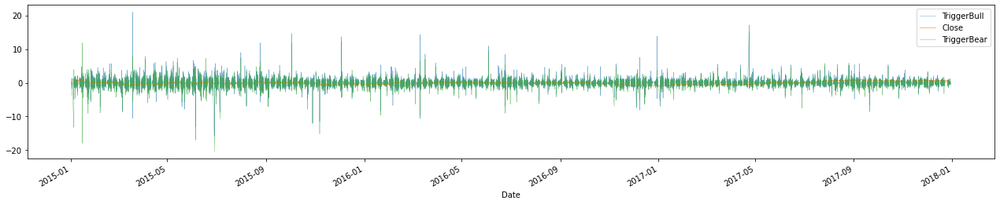

In [6]:
scaler = MinMaxScaler((-1,1))
df.TriggerBull.plot(figsize=(22,4),linewidth=0.5,alpha=0.6)
plt.plot(df.Close.index,scaler.fit_transform(df.Close.values.reshape(-1,1)),label='Close',alpha=0.8,linewidth=0.7)
df.TriggerBear.plot(figsize=(22,4),linewidth=0.5,alpha=0.6)

plt.legend()

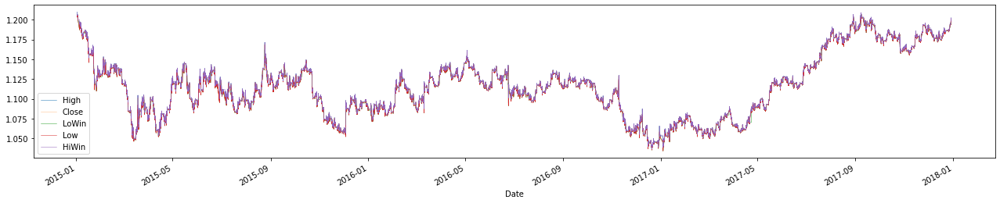

In [7]:
df.High.plot(figsize=(22,4),linewidth=0.5)
df.Close.plot(figsize=(22,4),alpha=0.5,linewidth=0.5)
df.LoWin.plot(figsize=(22,4),linewidth=0.5)
df.Low.plot(figsize=(22,4),linewidth=0.5)
df.HiWin.plot(figsize=(22,4),linewidth=0.5)

plt.legend()

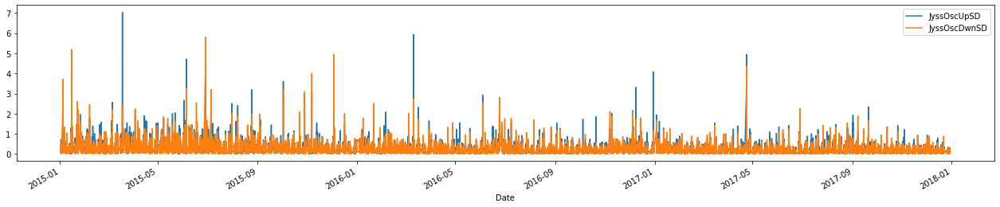

In [8]:
df.JyssOscUpSD.plot(figsize=(22,4))
df.JyssOscDwnSD.plot(figsize=(22,4))
plt.legend()

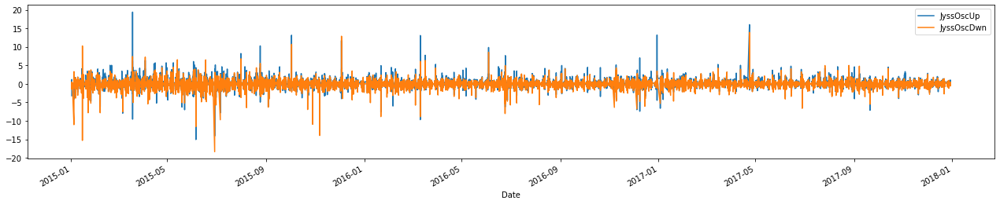

In [9]:
df.JyssOscUp.plot(figsize=(22,4))
df.JyssOscDwn.plot(figsize=(22,4))
plt.legend()

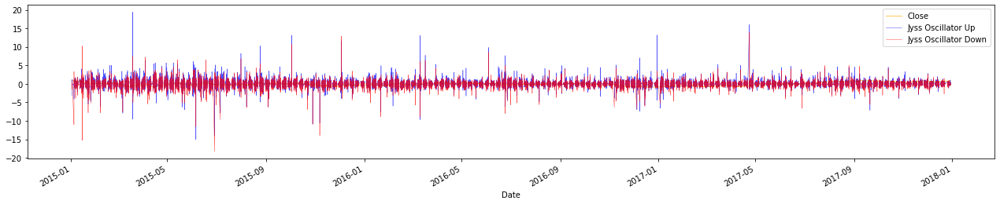

In [10]:

scaler = MinMaxScaler((-1,1))
plt.plot(df.Close.index,scaler.fit_transform(df.Close.values.reshape(-1,1)),label='Close',alpha=0.9,linewidth=0.7,color='orange')
df.JyssOscUp.plot(figsize=(22,4),label='Jyss Oscillator Up',alpha=0.7,linewidth=0.5,color='b')
df.JyssOscDwn.plot(figsize=(22,4),label='Jyss Oscillator Down',alpha=0.7,linewidth=0.5,color='r')
#df.JyssOscUpSD.plot(label='Std du Jyss Oscillator Up',alpha=0.7,linewidth=0.5)
#df.JyssOscDwnSD.plot(label='Std du Jyss Oscillator Down',alpha=0.7,linewidth=0.5)
#plt.plot(df.TriggerBull.index,scaler.fit_transform(df.TriggerBull.values.reshape(-1,1)),label='Trigger Bull',alpha=0.7,linewidth=0.5)
#plt.plot(df.TriggerBear.index,scaler.fit_transform(df.TriggerBear.values.reshape(-1,1)),label='Trigger Bear',alpha=0.7,linewidth=0.5)
plt.legend()
#plt.savefig('JyssOscillator',dpi=1000)


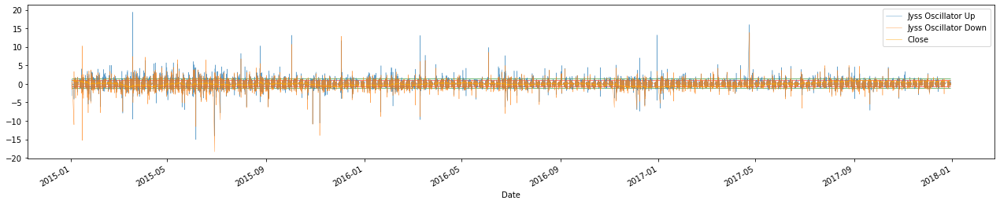

In [11]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler((-1,1))
df.JyssOscUp.plot(figsize=(22,4),label='Jyss Oscillator Up',alpha=0.7,linewidth=0.5)
df.JyssOscDwn.plot(figsize=(22,4),label='Jyss Oscillator Down',alpha=0.7,linewidth=0.5)
plt.plot(df.Close.index,scaler.fit_transform(df.Close.values.reshape(-1,1)),label='Close',color='orange',alpha=0.7,linewidth=0.6)
plt.hlines(xmin=df.index[0],xmax=df.index[-1],y=4*df.JyssOscUp.std(),color='green',alpha=0.9,linewidth=0.6)
plt.hlines(xmin=df.index[0],xmax=df.index[-1],y=-3*df.JyssOscUp.std(),color='green',alpha=0.9,linewidth=0.6)
plt.hlines(xmin=df.index[0],xmax=df.index[-1],y=2.5*df.JyssOscUp.std(),color='red',alpha=0.9,linewidth=0.6)
plt.hlines(xmin=df.index[0],xmax=df.index[-1],y=-1.5*df.JyssOscUp.std(),color='red',alpha=0.9,linewidth=0.6)
plt.legend()

In [12]:
'''df['Signal'] = np.where(\
    ((df.Close <= 1.01*df.LoWin)&(df.JyssOsc <= -4*df.JyssOscSD)),1,\
        np.where(\
            ((df.Close >= 0.99*df.HiWin)&(df.JyssOsc >= 4*df.JyssOscSD)),-1,0)
)
df['SignalClose'] = np.where(\
    ((df.Close >= 0.99*df.HiWin)&(df.JyssOsc <= -3*df.JyssOscSD)),1,\
        np.where(\
            ((df.Close <= 1.01*df.LoWin)&(df.JyssOsc >= 3*df.JyssOscSD)),-1,0)
)'''

"df['Signal'] = np.where(    ((df.Close <= 1.01*df.LoWin)&(df.JyssOsc <= -4*df.JyssOscSD)),1,        np.where(            ((df.Close >= 0.99*df.HiWin)&(df.JyssOsc >= 4*df.JyssOscSD)),-1,0)\n)\ndf['SignalClose'] = np.where(    ((df.Close >= 0.99*df.HiWin)&(df.JyssOsc <= -3*df.JyssOscSD)),1,        np.where(            ((df.Close <= 1.01*df.LoWin)&(df.JyssOsc >= 3*df.JyssOscSD)),-1,0)\n)"

In [13]:
df['Signal'] = np.where(\
    ((df.Close <= 1.01*df.LoWin)&(df.JyssOscUp <= -4*df.JyssOscUpSD)),1,\
        np.where(\
            ((df.Close >= 0.99*df.HiWin)&(df.JyssOscDwn >= 4*df.JyssOscDwnSD)),-1,0)
)
df['SignalClose'] = np.where(\
    ((df.Close >= 0.99*df.HiWin)&(df.JyssOscDwn <= -3*df.JyssOscDwnSD)),1,\
        np.where(\
            ((df.Close <= 1.01*df.LoWin)&(df.JyssOscUp >= 3*df.JyssOscUpSD)),-1,0)
)

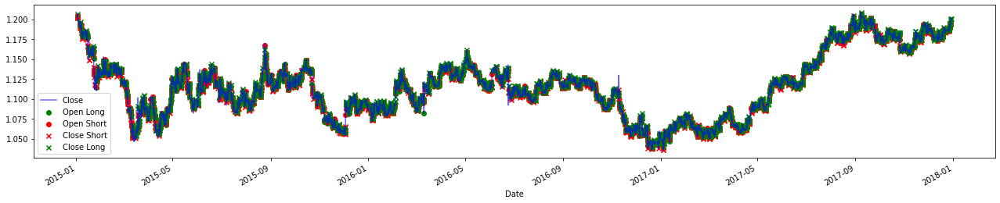

In [14]:
df.Close.plot(figsize=(22,4),label='Close',color='b',alpha=0.6)

plt.scatter(x=df[df.Signal==1].index,y=df[df.Signal==1].Close,color='green',marker='o',label='Open Long')

plt.scatter(x=df[df.Signal==-1].index,y=df[df.Signal==-1].Close,color='red',marker='o',label='Open Short')

plt.scatter(x=df[df.SignalClose==1].index,y=df[df.SignalClose==1].Close,color='red',marker='x',label='Close Short')

plt.scatter(x=df[df.SignalClose==-1].index,y=df[df.SignalClose==-1].Close,color='green',marker='x',label='Close Long')

plt.legend()

In [15]:
_nb_bougie_exit = 96000000
_trigger_reengage = 0
_trigger_target = 0
_trigger_invers = 1
_trigger_sl = 0
_verbose = 0
_cash_ini = 200000
_rate = 1
x = 'EUR/USD'
_target = 0.001
_exposure = 3
_size = 50000
_sl = 0.006
TRACKER = bt(df,_year_bottom,_year_top,_nb_bougie_exit,_trigger_reengage,_trigger_target,_trigger_invers,_trigger_sl,_verbose,_cash_ini,\
        _rate,x,_target,_exposure,_size,_sl)

Librairies imported

Début des opérations horodatée à 2020-12-14 14:25:54.646385

Chargement de la nouvelle base


 Le rate du ticker EUR/USD est à  1 
Bases chargées
TETEL process effectué
 ENTERING THE BACKTEST 
100%|██████████| 220966/220966 [00:19<00:00, 11304.50it/s]
 Pour le ticker  EUR/USD 
 
Les gains faramineux s'élèvent à : $  -44.0 !. En  457   transactions.
 
Nbre de winners : 268 
 
Nbre de loosers : 189 
Temps d'excution du BT 0:00:25.951237
 EUR/USD  results 
 Tested Period 2015-01-01 16:00:00  à 2017-12-31 16:00:00 
 Total Number of trades 457 
Started Cash : 50000
P&L in currency:  -44.0$ 
P&L in %:  -0.02% 
Average trade duration 339.25
# Winners  268.0
# Loosers  189.0
Cumulated gains 52333.5
Cumulated losses -52377.5
 PROFIT FACTOR :  1.0 
 Winners Ratio : 58.64 % 
Average Winners 195.27
% Average Winners 0.1
Average Loosers -277.13
% Average Loosers -0.14
Average pnl -0.1
% Average pnl -0.0
Number of opened trades 457
Number of closed trades 457
Max Exposure 1 x  5

In [16]:
len(TRACKER)

268

In [17]:
%%time
scaler = MinMaxScaler((0,1))
df_2 = df.copy()
df_2 = df_2.drop(['SignalClose'],axis=1)
df_2.loc[:, df_2.columns != 'Signal'] = scaler.fit_transform(df_2.loc[:, df_2.columns != 'Signal'].values) 
df_2.rename(columns = {'Signal':'Sig4bt'}, inplace = True)
SIGNAL = []
SIGNAL = [1 if (df_2.Sig4bt[i] != 0) & (df_2.index[i] in TRACKER) else 0 for i in tqdm(range(len(df_2)))]
df_2['Signal'] = SIGNAL
df_2 = df_2[['HigMax','LowMin','HiWin','LoWin','JyssOscUp','JyssOscUpSD','JyssOscDwn','JyssOscDwnSD',\
                                    'TriggerBull','TriggerBear','Trigger','Sig4bt','Signal']]
df_2 = df_2.dropna()
df_2 = df_2.sort_index(axis=1)

100%|██████████| 220996/220996 [00:09<00:00, 22328.15it/s]
CPU times: user 10.6 s, sys: 257 ms, total: 10.9 s
Wall time: 10.9 s


In [20]:
%%time
from tpot import TPOTClassifier
from sklearn.model_selection import RepeatedStratifiedKFold

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

X, y = df_2.loc[:, df_2.columns != 'Signal'].sort_index(axis=1), df_2['Signal']
model = TPOTClassifier(generations=5, population_size=50, cv=cv, scoring='accuracy', verbosity=2, random_state=1, n_jobs=-1)

model.fit(X, y)
model.export('tpot_best_model.py')



Generation 1 - Current best internal CV score: 0.9987871439686454

Generation 2 - Current best internal CV score: 0.9987871439686454

Generation 3 - Current best internal CV score: 0.9987871439686454

Generation 4 - Current best internal CV score: 0.9987886525373154

Generation 5 - Current best internal CV score: 0.9987886525373154

Best pipeline: SGDClassifier(LogisticRegression(input_matrix, C=15.0, dual=False, penalty=l2), alpha=0.0, eta0=0.1, fit_intercept=True, l1_ratio=0.25, learning_rate=constant, loss=log, penalty=elasticnet, power_t=10.0)
CPU times: user 31.6 s, sys: 3.01 s, total: 34.6 s
Wall time: 2h 8min 22s


In [18]:
# check pycaret version
import pycaret
from pycaret.classification import setup
from pycaret.classification import compare_models

print('PyCaret: %s' % pycaret.__version__)

PyCaret: 2.2.0


In [19]:
%%time
# setup the dataset
grid = setup(data=df_2.sort_index(axis=1), target='Signal', html=False, silent=False, verbose=True)

# evaluate models and compare models
best = compare_models()

# report the best model
print(best)

Text(value="Following data types have been inferred automatically, if they are correct press enter to continue…

,Data Type
HiWin,Numeric
HigMax,Numeric
JyssOscDwn,Numeric
JyssOscDwnSD,Numeric
JyssOscUp,Numeric
JyssOscUpSD,Numeric
LoWin,Numeric
LowMin,Numeric
Sig4bt,Categorical
Trigger,Categorical


Setup Succesfully Completed!


,Description,Value
0,session_id,2478
1,Target,Signal
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(220966, 13)"
5,Missing Values,False
6,Numeric Features,10
7,Categorical Features,2
8,Ordinal Features,False
9,High Cardinality Features,False


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0,0.0,0.0,0.0,0.0,0.661


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0000,0.0000,0.0000,0.0000,0.000,0.661
knn,K Neighbors Classifier,0.9986,0.8315,0.0278,0.1291,0.0442,0.0437,0.058,13.271


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0000,0.0000,0.0000,0.0000,0.000,0.661
knn,K Neighbors Classifier,0.9986,0.8315,0.0278,0.1291,0.0442,0.0437,0.058,13.271
nb,Naive Bayes,0.9944,0.9972,1.0000,0.1744,0.2967,0.2953,0.416,0.054


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0000,0.0000,0.0000,0.0000,0.0000,0.661
knn,K Neighbors Classifier,0.9986,0.8315,0.0278,0.1291,0.0442,0.0437,0.0580,13.271
dt,Decision Tree Classifier,0.9980,0.5828,0.1667,0.1532,0.1589,0.1579,0.1584,0.063
nb,Naive Bayes,0.9944,0.9972,1.0000,0.1744,0.2967,0.2953,0.4160,0.054


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0000,0.0000,0.0000,0.0000,0.0000,0.661
svm,SVM - Linear Kernel,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.081
knn,K Neighbors Classifier,0.9986,0.8315,0.0278,0.1291,0.0442,0.0437,0.0580,13.271
dt,Decision Tree Classifier,0.9980,0.5828,0.1667,0.1532,0.1589,0.1579,0.1584,0.063
nb,Naive Bayes,0.9944,0.9972,1.0000,0.1744,0.2967,0.2953,0.4160,0.054


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0000,0.0000,0.0000,0.0000,0.0000,0.661
svm,SVM - Linear Kernel,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.081
ridge,Ridge Classifier,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.052
knn,K Neighbors Classifier,0.9986,0.8315,0.0278,0.1291,0.0442,0.0437,0.0580,13.271
dt,Decision Tree Classifier,0.9980,0.5828,0.1667,0.1532,0.1589,0.1579,0.1584,0.063
nb,Naive Bayes,0.9944,0.9972,1.0000,0.1744,0.2967,0.2953,0.4160,0.054


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0000,0.0000,0.0000,0.0000,0.0000,0.661
svm,SVM - Linear Kernel,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.081
ridge,Ridge Classifier,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.052
rf,Random Forest Classifier,0.9987,0.9972,0.0056,0.0500,0.0100,0.0098,0.0163,1.412
knn,K Neighbors Classifier,0.9986,0.8315,0.0278,0.1291,0.0442,0.0437,0.0580,13.271
dt,Decision Tree Classifier,0.9980,0.5828,0.1667,0.1532,0.1589,0.1579,0.1584,0.063
nb,Naive Bayes,0.9944,0.9972,1.0000,0.1744,0.2967,0.2953,0.4160,0.054


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0000,0.0000,0.0000,0.0000,0.0000,0.661
svm,SVM - Linear Kernel,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.081
ridge,Ridge Classifier,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.052
rf,Random Forest Classifier,0.9987,0.9972,0.0056,0.0500,0.0100,0.0098,0.0163,1.412
knn,K Neighbors Classifier,0.9986,0.8315,0.0278,0.1291,0.0442,0.0437,0.0580,13.271
dt,Decision Tree Classifier,0.9980,0.5828,0.1667,0.1532,0.1589,0.1579,0.1584,0.063
nb,Naive Bayes,0.9944,0.9972,1.0000,0.1744,0.2967,0.2953,0.4160,0.054
qda,Quadratic Discriminant Analysis,0.8982,0.5439,0.2889,0.0336,0.0571,0.0566,0.0793,0.076


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0000,0.0000,0.0000,0.0000,0.0000,0.661
svm,SVM - Linear Kernel,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.081
ridge,Ridge Classifier,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.052
ada,Ada Boost Classifier,0.9988,0.9739,0.0056,0.1000,0.0105,0.0104,0.0233,1.666
rf,Random Forest Classifier,0.9987,0.9972,0.0056,0.0500,0.0100,0.0098,0.0163,1.412
knn,K Neighbors Classifier,0.9986,0.8315,0.0278,0.1291,0.0442,0.0437,0.0580,13.271
dt,Decision Tree Classifier,0.9980,0.5828,0.1667,0.1532,0.1589,0.1579,0.1584,0.063
nb,Naive Bayes,0.9944,0.9972,1.0000,0.1744,0.2967,0.2953,0.4160,0.054
qda,Quadratic Discriminant Analysis,0.8982,0.5439,0.2889,0.0336,0.0571,0.0566,0.0793,0.076


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0000,0.0000,0.0000,0.0000,0.0000,0.661
svm,SVM - Linear Kernel,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.081
ridge,Ridge Classifier,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.052
ada,Ada Boost Classifier,0.9988,0.9739,0.0056,0.1000,0.0105,0.0104,0.0233,1.666
rf,Random Forest Classifier,0.9987,0.9972,0.0056,0.0500,0.0100,0.0098,0.0163,1.412
knn,K Neighbors Classifier,0.9986,0.8315,0.0278,0.1291,0.0442,0.0437,0.0580,13.271
dt,Decision Tree Classifier,0.9980,0.5828,0.1667,0.1532,0.1589,0.1579,0.1584,0.063
gbc,Gradient Boosting Classifier,0.9951,0.9750,0.8611,0.2561,0.2744,0.2731,0.3877,4.073
nb,Naive Bayes,0.9944,0.9972,1.0000,0.1744,0.2967,0.2953,0.4160,0.054
qda,Quadratic Discriminant Analysis,0.8982,0.5439,0.2889,0.0336,0.0571,0.0566,0.0793,0.076


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0000,0.0000,0.0000,0.0000,0.0000,0.661
svm,SVM - Linear Kernel,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.081
ridge,Ridge Classifier,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.052
ada,Ada Boost Classifier,0.9988,0.9739,0.0056,0.1000,0.0105,0.0104,0.0233,1.666
rf,Random Forest Classifier,0.9987,0.9972,0.0056,0.0500,0.0100,0.0098,0.0163,1.412
knn,K Neighbors Classifier,0.9986,0.8315,0.0278,0.1291,0.0442,0.0437,0.0580,13.271
dt,Decision Tree Classifier,0.9980,0.5828,0.1667,0.1532,0.1589,0.1579,0.1584,0.063
gbc,Gradient Boosting Classifier,0.9951,0.9750,0.8611,0.2561,0.2744,0.2731,0.3877,4.073
nb,Naive Bayes,0.9944,0.9972,1.0000,0.1744,0.2967,0.2953,0.4160,0.054
lda,Linear Discriminant Analysis,0.9944,0.9972,1.0000,0.1744,0.2967,0.2953,0.4160,0.146


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0000,0.0000,0.0000,0.0000,0.0000,0.661
svm,SVM - Linear Kernel,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.081
ridge,Ridge Classifier,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.052
ada,Ada Boost Classifier,0.9988,0.9739,0.0056,0.1000,0.0105,0.0104,0.0233,1.666
rf,Random Forest Classifier,0.9987,0.9972,0.0056,0.0500,0.0100,0.0098,0.0163,1.412
et,Extra Trees Classifier,0.9987,0.9918,0.0444,0.1700,0.0697,0.0694,0.0857,0.579
knn,K Neighbors Classifier,0.9986,0.8315,0.0278,0.1291,0.0442,0.0437,0.0580,13.271
dt,Decision Tree Classifier,0.9980,0.5828,0.1667,0.1532,0.1589,0.1579,0.1584,0.063
gbc,Gradient Boosting Classifier,0.9951,0.9750,0.8611,0.2561,0.2744,0.2731,0.3877,4.073
nb,Naive Bayes,0.9944,0.9972,1.0000,0.1744,0.2967,0.2953,0.4160,0.054


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0000,0.0000,0.0000,0.0000,0.0000,0.661
svm,SVM - Linear Kernel,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.081
ridge,Ridge Classifier,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.052
ada,Ada Boost Classifier,0.9988,0.9739,0.0056,0.1000,0.0105,0.0104,0.0233,1.666
rf,Random Forest Classifier,0.9987,0.9972,0.0056,0.0500,0.0100,0.0098,0.0163,1.412
et,Extra Trees Classifier,0.9987,0.9918,0.0444,0.1700,0.0697,0.0694,0.0857,0.579
knn,K Neighbors Classifier,0.9986,0.8315,0.0278,0.1291,0.0442,0.0437,0.0580,13.271
dt,Decision Tree Classifier,0.9980,0.5828,0.1667,0.1532,0.1589,0.1579,0.1584,0.063
gbc,Gradient Boosting Classifier,0.9951,0.9750,0.8611,0.2561,0.2744,0.2731,0.3877,4.073
nb,Naive Bayes,0.9944,0.9972,1.0000,0.1744,0.2967,0.2953,0.4160,0.054


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0000,0.0000,0.0000,0.0000,0.0000,0.661
svm,SVM - Linear Kernel,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.081
ridge,Ridge Classifier,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.052
ada,Ada Boost Classifier,0.9988,0.9739,0.0056,0.1000,0.0105,0.0104,0.0233,1.666
rf,Random Forest Classifier,0.9987,0.9972,0.0056,0.0500,0.0100,0.0098,0.0163,1.412
et,Extra Trees Classifier,0.9987,0.9918,0.0444,0.1700,0.0697,0.0694,0.0857,0.579
knn,K Neighbors Classifier,0.9986,0.8315,0.0278,0.1291,0.0442,0.0437,0.0580,13.271
dt,Decision Tree Classifier,0.9980,0.5828,0.1667,0.1532,0.1589,0.1579,0.1584,0.063
lightgbm,Light Gradient Boosting Machine,0.9976,0.7940,0.1889,0.1414,0.1587,0.1576,0.1607,0.395
gbc,Gradient Boosting Classifier,0.9951,0.9750,0.8611,0.2561,0.2744,0.2731,0.3877,4.073


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0000,0.0000,0.0000,0.0000,0.0000,0.661
svm,SVM - Linear Kernel,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.081
ridge,Ridge Classifier,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.052
ada,Ada Boost Classifier,0.9988,0.9739,0.0056,0.1000,0.0105,0.0104,0.0233,1.666
rf,Random Forest Classifier,0.9987,0.9972,0.0056,0.0500,0.0100,0.0098,0.0163,1.412
et,Extra Trees Classifier,0.9987,0.9918,0.0444,0.1700,0.0697,0.0694,0.0857,0.579
knn,K Neighbors Classifier,0.9986,0.8315,0.0278,0.1291,0.0442,0.0437,0.0580,13.271
catboost,CatBoost Classifier,0.9986,0.9972,0.0389,0.1225,0.0588,0.0583,0.0683,32.939
dt,Decision Tree Classifier,0.9980,0.5828,0.1667,0.1532,0.1589,0.1579,0.1584,0.063
lightgbm,Light Gradient Boosting Machine,0.9976,0.7940,0.1889,0.1414,0.1587,0.1576,0.1607,0.395


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9988,0.9973,0.0000,0.0000,0.0000,0.0000,0.0000,0.661
svm,SVM - Linear Kernel,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.081
ridge,Ridge Classifier,0.9988,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.052
ada,Ada Boost Classifier,0.9988,0.9739,0.0056,0.1000,0.0105,0.0104,0.0233,1.666
rf,Random Forest Classifier,0.9987,0.9972,0.0056,0.0500,0.0100,0.0098,0.0163,1.412
et,Extra Trees Classifier,0.9987,0.9918,0.0444,0.1700,0.0697,0.0694,0.0857,0.579
knn,K Neighbors Classifier,0.9986,0.8315,0.0278,0.1291,0.0442,0.0437,0.0580,13.271
catboost,CatBoost Classifier,0.9986,0.9972,0.0389,0.1225,0.0588,0.0583,0.0683,32.939
dt,Decision Tree Classifier,0.9980,0.5828,0.1667,0.1532,0.1589,0.1579,0.1584,0.063
lightgbm,Light Gradient Boosting Machine,0.9976,0.7940,0.1889,0.1414,0.1587,0.1576,0.1607,0.395


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=2478, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
CPU times: user 11.3 s, sys: 1.6 s, total: 12.9 s
Wall time: 9min 34s


In [18]:
from reglog import modelize
_model = 'reglog'
modelize(df_2[df_2.Sig4bt != 0],x,_model,0)

 Regression Logistique pour  EUR/USD 
Signaux achat Counter({0: 1233, 1: 268})
 Pour  EUR/USD 

Achat - Accuracy : 82.11 %
Achat - Precision : 0.0 %
Achat - Recall : 0.0 %
Achat - F-measure: : 0.0 % 


              precision    recall  f1-score   support

           0       0.82      1.00      0.90       863
           1       0.00      0.00      0.00       188

    accuracy                           0.82      1051
   macro avg       0.41      0.50      0.45      1051
weighted avg       0.67      0.82      0.74      1051

              Vrais_estimés    Faux_estimés
vrais_réels  Vrais_positifs    Faux_négatif
Faux_réels    Faux_positifs  Vrais-négatifs
[[863   0]
 [188   0]]


 Joblib Model  JOBLIB/reglog/SaveEURUSDm5.sav  dumped to disk 
Best Threshold=0.000000, F-Score=0.303


()

In [19]:
%%time
print('Modèle retenu, ',_model)
_year_bottom = pd.to_datetime('2019-01-01 16:00:00')
_year_top = pd.to_datetime('2019-01-31 16:00:00') #2020-11-23 16:00:00

df_oos = base[(base.index>=_year_bottom)&(base.index<=_year_top)]

df_oos['HiWin'] = df_oos.High.rolling(10).max()
df_oos['LoWin'] = df_oos.Low.rolling(10).min()
df_oos['JyssOscUp'] = ((df_oos.HiWin - df_oos.HiWin.shift(2)) / df_oos.HiWin.shift(2))*1000
df_oos['JyssOscUpSD'] = df_oos.JyssOscUp.rolling(20).std()
df_oos['JyssOscDwn'] = ((df_oos.LoWin - df_oos.LoWin.shift(2)) / df_oos.LoWin.shift(2))*1000
df_oos['JyssOscDwnSD'] = df_oos.JyssOscDwn.rolling(20).std()
df_oos['TriggerBull'] = (df_oos.HiWin - df_oos.HiWin.shift(2)) * 1000
df_oos['TriggerBear'] = (df_oos.LoWin - df_oos.LoWin.shift(2)) * 1000
df_oos['Trigger'] = np.where((df_oos.LoWin - df_oos.LoWin.shift(9) == 0),1,np.where((df_oos.HiWin - df_oos.HiWin.shift(9) == 0 ),1,0))


df_oos['Signal'] = np.where(\
    ((df_oos.Close <= 1.01 * df_oos.LoWin) & (df_oos.JyssOscUp <= -4*df_oos.JyssOscUpSD)),1,\
        np.where(\
            ((df_oos.Close >= 0.99 * df_oos.HiWin) & (df_oos.JyssOscDwn >= 4*df_oos.JyssOscDwnSD)),-1,0)
)
df_oos['SignalClose'] = np.where(\
    ((df_oos.Close >= 0.99 * df_oos.HiWin) & (df_oos.JyssOscDwn <= -3 * df_oos.JyssOscDwnSD)),1,\
        np.where(\
            ((df_oos.Close <= 1.01 * df_oos.LoWin) & (df_oos.JyssOscUp >= 3 * df_oos.JyssOscUpSD)),-1,0)
)


df_oos = df_oos.drop(['SignalClose'],axis=1)
df_oos.rename(columns = {'Signal':'Sig4bt'}, inplace = True)

loaded_model = joblib.load('JOBLIB/'+_model+'/SaveEURUSDm5.sav')
df_oos = df_oos.dropna()
df_oos = df_oos.sort_index(axis=1)
df_oos['Signal_hat'] = loaded_model.predict(scaler.fit_transform(df_oos[['HigMax','LowMin','HiWin','LoWin','JyssOscUp','JyssOscUpSD','JyssOscDwn','JyssOscDwnSD',\
                                    'TriggerBull','TriggerBear','Trigger','Sig4bt']].values))

df_oos['Signal'] = np.where(
                            ((df_oos.Sig4bt == 1)&(df_oos.Signal_hat==0)),1,\
                                np.where(((df_oos.Sig4bt == -1)&(df_oos.Signal_hat==0)),-1,0)


)

Modèle retenu,  reglog
CPU times: user 122 ms, sys: 30.4 ms, total: 152 ms
Wall time: 44 ms


In [20]:
_nb_bougie_exit = 60000
_trigger_reengage = 0
_trigger_target = 0
_trigger_invers = 1
_trigger_sl = 0
_verbose = 1
_cash_ini = 200000
_rate = 1
x = 'EUR/USD'
_target = 0.003
_exposure = 10
_size = 50000
_sl = 0.008

bt(df_oos,_year_bottom,_year_top,_nb_bougie_exit,_trigger_reengage,_trigger_target,_trigger_invers,_trigger_sl,_verbose,_cash_ini,\
        _rate,x,_target,_exposure,_size,_sl)

Librairies imported

Début des opérations horodatée à 2020-12-14 14:27:08.646380

Chargement de la nouvelle base


 Le rate du ticker EUR/USD est à  1 
Bases chargées
TETEL process effectué
 ENTERING THE BACKTEST 
 35%|███▍      | 2119/6064 [00:00<00:00, 11026.86it/s] 2019-01-02 10:55:00 
Position 1 bought at 1.14489 (verification liste 1.14489 )
 2019-01-03 17:55:00 
1 positions (INV) closed at 1.1392  pnl -284.49999999999864 
nombre de candles en position : 371
Equity : 199715.5
 2019-01-04 05:15:00 
Position 1 bought at 1.13921 (verification liste 1.13921 )
 2019-01-04 18:30:00 
1 positions (INV) closed at 1.14073  pnl 75.9999999999983 
nombre de candles en position : 155
Equity : 199791.5
 2019-01-08 06:20:00 
Position 1 bought at 1.14353 (verification liste 1.14353 )
 2019-01-09 10:00:00 
1 positions (INV) closed at 1.14675  pnl 161.00000000000003 
nombre de candles en position : 325
Equity : 199952.5
 2019-01-09 17:25:00 
Position 1 sold at 1.1529200000000002 (verification liste 

[Timestamp('2019-01-04 05:15:00'),
 Timestamp('2019-01-08 06:20:00'),
 Timestamp('2019-01-09 17:25:00'),
 Timestamp('2019-01-11 16:55:00'),
 Timestamp('2019-01-14 20:50:00'),
 Timestamp('2019-01-21 17:15:00'),
 Timestamp('2019-01-24 19:40:00'),
 Timestamp('2019-01-28 07:35:00'),
 Timestamp('2019-01-30 09:45:00')]

In [23]:
len(df_oos[df_oos.Signal==0])

6027

In [49]:
df.sort_index(axis=1).info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 73147 entries, 2019-01-02 07:25:00 to 2019-12-31 16:00:00
Data columns (total 25 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Close         73147 non-null  float64
 1   CloseAsk      73147 non-null  float64
 2   CloseBid      73147 non-null  float64
 3   HiWin         73138 non-null  float64
 4   HigMax        73147 non-null  float64
 5   High          73147 non-null  float64
 6   HighAsk       73147 non-null  float64
 7   HighBid       73147 non-null  float64
 8   JyssOscDwn    73136 non-null  float64
 9   JyssOscDwnSD  73117 non-null  float64
 10  JyssOscUp     73136 non-null  float64
 11  JyssOscUpSD   73117 non-null  float64
 12  LoWin         73138 non-null  float64
 13  Low           73147 non-null  float64
 14  LowAsk        73147 non-null  float64
 15  LowBid        73147 non-null  float64
 16  LowMin        73147 non-null  float64
 17  Open          73147 non-null  floa